## Keypoint Detection
---
There are 5 images given in the ***img*** folder. Your task is to detect ***200*** keypoints for each of them using detectors.

You are free to use any languages (C, Matlab, Python), any keypoint detection methods (such as SIFT, ORB, ...)

Let's take a look at these images first!

---

In [1]:
# load packages
import cv2
import numpy as np
import os
import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
print("Done!")

Done!


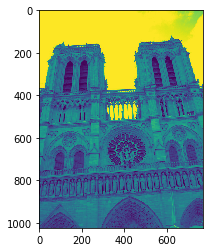

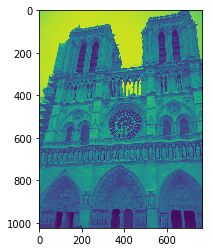

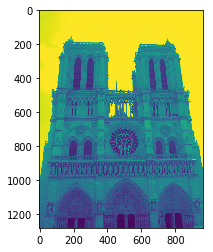

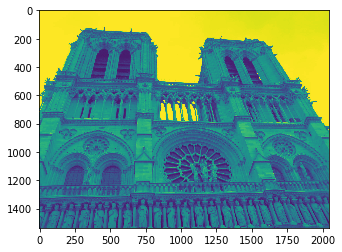

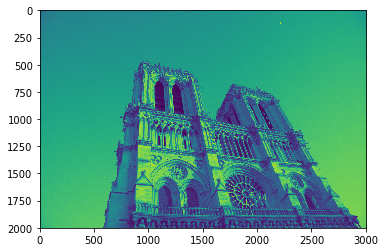

Done!


In [2]:
img_dir = "../images"
if os.path.exists(img_dir):
    if os.listdir(img_dir) is []:
        print("No images!")
        exit(0)
    num_img = len(os.listdir(img_dir))
    for img in os.listdir(img_dir):
        if not img.endswith("jpg"):
            continue
        image_dir = os.path.join(img_dir, img)
        image = cv2.imread(image_dir)
        gray= cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
        plt.imshow(gray)
        plt.show()
else:
    print("image folder not exists!")
    exit(0)
print("Done!")

### The Keypoints:
The output of this part is a list of keypoints that represented by the x and y cooridnates.

For example, the 10 points of image ***NotreDame5.jpg*** are:

In [15]:
keypoint = list([(1896.0, 1815.0), (1614.0, 1164.0), (1471.0, 964.0), (2099.0, 1032.0), (2080.0, 980.0), (1462.0, 925.0), (1707.0, 1057.0), (1840.0, 1138.0), (1309.0, 1105.0), (1959.0, 1778.0)])
# keypoints = list([(20, 400)])
keypoint1 = list([(143, 671),(143, 672),(143, 673),(144, 671),(144, 672),(144, 673),(145, 671),(145, 672),(145, 673),(153, 589),(153, 590),(153, 591),(154, 589),(154, 590),(154, 591),(154, 592),(154, 593),(155, 589),(155, 590),(155, 591),(155, 592),(155, 593),(156, 589),(156, 590),(156, 591),(156, 592),(156, 593),(157, 222),(157, 223),(157, 224),(158, 222),(158, 223),(158, 224),(159, 222),(159, 223),(159, 224),(174, 136),(174, 137),(174, 138),(175, 136),(175, 137),(175, 138),(176, 136),(176, 137),(176, 138),(350, 755),(350, 756),(350, 757),(351, 755),(351, 756),(351, 757),(352, 755),(352, 756),(352, 757),(354, 755),(354, 756),(354, 757),(355, 755),(355, 756),(355, 757),(356, 755),(356, 756),(356, 757),(432, 444),(432, 445),(432, 446),(433, 444),(433, 445),(433, 446),(434, 402),(434, 403),(434, 404),(434, 444),(434, 445),(434, 446),(435, 402),(435, 403),(435, 404),(435, 425),(435, 426),(435, 427),(436, 360),(436, 361),(436, 362),(436, 384),(436, 385),(436, 386),(436, 402),(436, 403),(436, 404),(436, 425),(436, 426),(436, 427),(436, 428),(436, 429),(436, 430),(437, 322),(437, 323),(437, 324),(437, 342),(437, 343),(437, 344),(437, 360),(437, 361),(437, 362),(437, 383),(437, 384),(437, 385),(437, 386),(437, 402),(437, 403),(437, 404),(437, 425),(437, 426),(437, 427),(437, 428),(437, 429),(437, 430),(438, 322),(438, 323),(438, 324),(438, 342),(438, 343),(438, 344),(438, 360),(438, 361),(438, 362),(438, 383),(438, 384),(438, 385),(438, 386),(438, 428),(438, 429),(438, 430),(439, 322),(439, 323),(439, 324),(439, 342),(439, 343),(439, 344),(439, 360),(439, 361),(439, 362),(439, 383),(439, 384),(439, 385),(445, 321),(445, 322),(445, 323),(446, 321),(446, 322),(446, 323),(447, 321),(447, 322),(447, 323),(452, 323),(452, 324),(452, 325),(452, 326),(452, 463),(452, 464),(452, 465),(452, 466),(453, 321),(453, 322),(453, 323),(453, 324),(453, 325),(453, 326),(453, 463),(453, 464),(453, 465),(453, 466),(454, 321),(454, 322),(454, 323),(454, 324),(454, 325),(454, 326),(454, 463),(454, 464),(454, 465),(454, 466),(455, 321),(455, 322),(455, 323),(455, 324),(455, 325),(485, 467),(485, 468),(485, 469),(486, 467),(486, 468),(486, 469),(487, 467),(487, 468),(487, 469),(490, 324),(490, 325),(490, 326)])
print(len(keypoint1))
keypoint2 = list([(84, 198),(84, 199),(84, 200),(85, 198),(85, 199),(85, 200),(86, 198),(86, 199),(86, 200),(134, 479),(134, 480),(134, 481),(135, 479),(135, 480),(135, 481),(136, 479),(136, 480),(136, 481),(205, 376),(205, 377),(205, 378),(206, 376),(206, 377),(206, 378),(207, 376),(207, 377),(207, 378),(208, 377),(208, 378),(208, 379),(209, 375),(209, 376),(209, 377),(209, 378),(209, 379),(210, 375),(210, 376),(210, 377),(210, 378),(210, 379),(211, 375),(211, 376),(211, 377),(211, 378),(211, 379),(240, 388),(240, 389),(240, 390),(241, 388),(241, 389),(241, 390),(242, 388),(242, 389),(242, 390),(242, 758),(242, 759),(242, 760),(243, 758),(243, 759),(243, 760),(244, 758),(244, 759),(244, 760),(275, 448),(275, 449),(275, 450),(276, 448),(276, 449),(276, 450),(277, 448),(277, 449),(277, 450),(327, 453),(327, 454),(327, 455),(327, 456),(328, 452),(328, 453),(328, 454),(328, 455),(328, 456),(329, 452),(329, 453),(329, 454),(329, 455),(329, 456),(330, 452),(330, 453),(330, 454),(331, 415),(331, 416),(331, 417),(332, 414),(332, 415),(332, 416),(332, 417),(333, 414),(333, 415),(333, 416),(333, 417),(333, 426),(333, 427),(333, 428),(334, 414),(334, 415),(334, 416),(334, 417),(334, 426),(334, 427),(334, 428),(335, 426),(335, 427),(335, 428),(338, 449),(338, 450),(338, 451),(339, 449),(339, 450),(339, 451),(340, 449),(340, 450),(340, 451),(342, 410),(342, 411),(342, 412),(342, 413),(343, 410),(343, 411),(343, 412),(343, 413),(343, 429),(343, 430),(343, 431),(344, 390),(344, 391),(344, 392),(344, 393),(344, 410),(344, 411),(344, 412),(344, 413),(344, 429),(344, 430),(344, 431),(345, 390),(345, 391),(345, 392),(345, 393),(345, 411),(345, 412),(345, 413),(345, 429),(345, 430),(345, 431),(346, 390),(346, 391),(346, 392),(346, 393),(346, 411),(346, 412),(346, 413),(347, 391),(347, 392),(347, 393),(347, 428),(347, 429),(347, 430),(348, 391),(348, 392),(348, 393),(348, 428),(348, 429),(348, 430),(349, 428),(349, 429),(349, 430),(350, 409),(350, 410),(350, 411),(351, 409),(351, 410),(351, 411),(351, 471),(351, 472),(351, 473),(352, 389),(352, 390),(352, 391),(352, 409),(352, 410),(352, 411),(352, 471),(352, 472),(352, 473),(353, 389),(353, 390),(353, 391),(353, 471),(353, 472),(353, 473)])
print(len(keypoint2))
keypoint3 = list([(529, 429),(529, 430),(529, 431),(530, 429),(530, 430),(530, 431),(531, 429),(531, 430),(531, 431),(536, 480),(536, 481),(536, 482),(536, 522),(536, 523),(536, 524),(537, 480),(537, 481),(537, 482),(537, 522),(537, 523),(537, 524),(538, 435),(538, 436),(538, 437),(538, 438),(538, 478),(538, 479),(538, 480),(538, 481),(538, 482),(538, 522),(538, 523),(538, 524),(538, 547),(538, 548),(538, 549),(539, 435),(539, 436),(539, 437),(539, 438),(539, 478),(539, 479),(539, 480),(539, 499),(539, 500),(539, 501),(539, 520),(539, 521),(539, 522),(539, 547),(539, 548),(539, 549),(540, 435),(540, 436),(540, 437),(540, 438),(540, 465),(540, 466),(540, 467),(540, 478),(540, 479),(540, 480),(540, 499),(540, 500),(540, 501),(540, 520),(540, 521),(540, 522),(540, 547),(540, 548),(540, 549),(541, 465),(541, 466),(541, 467),(541, 499),(541, 500),(541, 501),(541, 520),(541, 521),(541, 522),(542, 465),(542, 466),(542, 467),(543, 465),(543, 466),(543, 467),(544, 480),(544, 481),(544, 482),(545, 480),(545, 481),(545, 482),(545, 483),(546, 480),(546, 481),(546, 482),(546, 483),(547, 480),(547, 481),(547, 482),(547, 483),(549, 413),(549, 414),(549, 415),(550, 413),(550, 414),(550, 415),(551, 413),(551, 414),(551, 415),(553, 526),(553, 527),(553, 528),(554, 463),(554, 464),(554, 465),(554, 466),(554, 526),(554, 527),(554, 528),(555, 463),(555, 464),(555, 465),(555, 466),(555, 526),(555, 527),(555, 528),(556, 463),(556, 464),(556, 465),(556, 466),(558, 527),(558, 528),(558, 529),(559, 527),(559, 528),(559, 529),(560, 527),(560, 528),(560, 529),(560, 550),(560, 551),(560, 552),(561, 550),(561, 551),(561, 552),(562, 550),(562, 551),(562, 552),(563, 549),(563, 550),(563, 551),(563, 552),(563, 553),(564, 549),(564, 550),(564, 551),(564, 552),(564, 553),(565, 549),(565, 550),(565, 551),(565, 552),(565, 553),(571, 550),(571, 551),(571, 552),(572, 550),(572, 551),(572, 552),(573, 550),(573, 551),(573, 552),(574, 540),(574, 541),(574, 542),(574, 550),(574, 551),(574, 552),(575, 540),(575, 541),(575, 542),(575, 550),(575, 551),(575, 552),(576, 540),(576, 541),(576, 542),(576, 550),(576, 551),(576, 552),(577, 550),(577, 551),(577, 552),(604, 543),(604, 544),(604, 545),(605, 543),(605, 544),(605, 545)])
print(len(keypoint3))
keypoint4 = list([(206, 1460),(206, 1461),(206, 1462),(207, 1460),(207, 1461),(207, 1462),(208, 1460),(208, 1461),(208, 1462),(250, 1162),(250, 1163),(250, 1164),(251, 1162),(251, 1163),(251, 1164),(252, 1162),(252, 1163),(252, 1164),(469, 1133),(469, 1134),(469, 1135),(470, 1133),(470, 1134),(470, 1135),(471, 1133),(471, 1134),(471, 1135),(474, 1556),(474, 1557),(474, 1558),(475, 1556),(475, 1557),(475, 1558),(476, 1556),(476, 1557),(476, 1558),(509, 1813),(509, 1814),(509, 1815),(510, 1813),(510, 1814),(510, 1815),(510, 1816),(510, 1817),(510, 1818),(511, 1813),(511, 1814),(511, 1815),(511, 1816),(511, 1817),(511, 1818),(512, 1816),(512, 1817),(512, 1818),(521, 877),(521, 878),(521, 879),(522, 877),(522, 878),(522, 879),(523, 877),(523, 878),(523, 879),(528, 1008),(528, 1009),(528, 1010),(529, 1008),(529, 1009),(529, 1010),(530, 1008),(530, 1009),(530, 1010),(621, 1903),(621, 1904),(621, 1905),(622, 1903),(622, 1904),(622, 1905),(623, 1903),(623, 1904),(623, 1905),(639, 890),(639, 891),(639, 892),(640, 890),(640, 891),(640, 892),(640, 904),(640, 905),(640, 906),(641, 890),(641, 891),(641, 892),(641, 904),(641, 905),(641, 906),(642, 890),(642, 891),(642, 892),(642, 904),(642, 905),(642, 906),(644, 992),(644, 993),(644, 994),(644, 995),(645, 992),(645, 993),(645, 994),(645, 995),(646, 992),(646, 993),(646, 994),(646, 995),(646, 996),(646, 997),(646, 998),(647, 995),(647, 996),(647, 997),(647, 998),(648, 995),(648, 996),(648, 997),(648, 998),(649, 1096),(649, 1097),(649, 1098),(650, 894),(650, 895),(650, 896),(650, 1096),(650, 1097),(650, 1098),(651, 894),(651, 895),(651, 896),(651, 1096),(651, 1097),(651, 1098),(652, 894),(652, 895),(652, 896),(661, 879),(661, 880),(661, 881),(662, 879),(662, 880),(662, 881),(663, 879),(663, 880),(663, 881),(665, 883),(665, 884),(665, 885),(665, 886),(666, 883),(666, 884),(666, 885),(666, 886),(667, 883),(667, 884),(667, 885),(667, 886),(668, 1028),(668, 1029),(668, 1030),(669, 1028),(669, 1029),(669, 1030),(670, 1028),(670, 1029),(670, 1030),(680, 884),(680, 885),(680, 886),(681, 884),(681, 885),(681, 886),(681, 887),(681, 888),(681, 889),(682, 884),(682, 885),(682, 886),(682, 887),(682, 888),(682, 889),(683, 887),(683, 888),(683, 889),(685, 1003),(685, 1004),(685, 1005),(686, 990),(686, 991),(686, 992),(686, 1003),(686, 1004),(686, 1005)])
print(len(keypoint4))
keypoint5 = list([(885, 1002),(885, 1003),(885, 1004),(885, 1005),(886, 1002),(886, 1003),(886, 1004),(886, 1005),(887, 1002),(887, 1003),(887, 1004),(887, 1005),(944, 1229),(944, 1230),(944, 1231),(945, 1229),(945, 1230),(945, 1231),(945, 1232),(946, 1229),(946, 1230),(946, 1231),(946, 1232),(947, 1229),(947, 1230),(947, 1231),(947, 1232),(1001, 2091),(1001, 2092),(1001, 2093),(1002, 2091),(1002, 2092),(1002, 2093),(1003, 2091),(1003, 2092),(1003, 2093),(1035, 1051),(1035, 1052),(1035, 1053),(1036, 1051),(1036, 1052),(1036, 1053),(1037, 1051),(1037, 1052),(1037, 1053),(1040, 1222),(1040, 1223),(1040, 1224),(1041, 1222),(1041, 1223),(1041, 1224),(1042, 1222),(1042, 1223),(1042, 1224),(1051, 1871),(1051, 1872),(1051, 1873),(1052, 1168),(1052, 1169),(1052, 1170),(1052, 1871),(1052, 1872),(1052, 1873),(1053, 1168),(1053, 1169),(1053, 1170),(1053, 1871),(1053, 1872),(1053, 1873),(1054, 1168),(1054, 1169),(1054, 1170),(1054, 1871),(1054, 1872),(1054, 1873),(1055, 1168),(1055, 1169),(1055, 1170),(1057, 1333),(1057, 1334),(1057, 1335),(1058, 1333),(1058, 1334),(1058, 1335),(1059, 1333),(1059, 1334),(1059, 1335),(1070, 1077),(1070, 1078),(1070, 1079),(1071, 1077),(1071, 1078),(1071, 1079),(1072, 1077),(1072, 1078),(1072, 1079),(1073, 1077),(1073, 1078),(1073, 1079),(1073, 1482),(1073, 1483),(1073, 1484),(1074, 1482),(1074, 1483),(1074, 1484),(1075, 1482),(1075, 1483),(1075, 1484),(1076, 1285),(1076, 1286),(1076, 1287),(1077, 1285),(1077, 1286),(1077, 1287),(1078, 1285),(1078, 1286),(1078, 1287),(1080, 1140),(1080, 1141),(1080, 1142),(1081, 1140),(1081, 1141),(1081, 1142),(1082, 1140),(1082, 1141),(1082, 1142),(1088, 1194),(1088, 1195),(1088, 1196),(1089, 1194),(1089, 1195),(1089, 1196),(1090, 1194),(1090, 1195),(1090, 1196),(1105, 1309),(1105, 1310),(1105, 1311),(1105, 1666),(1105, 1667),(1105, 1668),(1106, 1309),(1106, 1310),(1106, 1311),(1106, 1666),(1106, 1667),(1106, 1668),(1107, 1309),(1107, 1310),(1107, 1311),(1107, 1666),(1107, 1667),(1107, 1668),(1108, 1252),(1108, 1253),(1108, 1254),(1109, 1252),(1109, 1253),(1109, 1254),(1110, 1252),(1110, 1253),(1110, 1254),(1125, 1601),(1125, 1602),(1125, 1603),(1126, 1601),(1126, 1602),(1126, 1603),(1127, 1601),(1127, 1602),(1127, 1603),(1130, 1713),(1130, 1714),(1130, 1715),(1131, 1713),(1131, 1714),(1131, 1715),(1132, 1713),(1132, 1714),(1132, 1715),(1165, 1822),(1165, 1823),(1165, 1824),(1166, 1543),(1166, 1544),(1166, 1545),(1166, 1822),(1166, 1823),(1166, 1824),(1167, 1543),(1167, 1544),(1167, 1545),(1167, 1822),(1167, 1823),(1167, 1824),(1168, 1543),(1168, 1544),(1168, 1545),(1168, 1546),(1169, 1543)])
print(len(keypoint5))
print("Done!")

200
200
200
200
200
Done!


Then we can obtain the patches with these keypoints:


In [16]:
def getPatches(kps, img, size=32, num=500):
    res = torch.zeros(num, 1, size, size)
    if type(img) is np.ndarray:
        img = torch.from_numpy(img)
    h, w = img.shape      # note: for image, the x direction is the verticle, y-direction is the horizontal...
    for i in range(num):
        cx, cy = kps[i]
        cx, cy = int(cx), int(cy)
        dd = int(size/2)
        xmin, xmax = max(0, cx - dd), min(w, cx + dd ) - 1
        ymin, ymax = max(0, cy - dd), min(h, cy + dd ) - 1 
        
        xmin_res, xmax_res = dd - min(dd,cx), dd + min(dd, w - cx)-1
        ymin_res, ymax_res = dd - min(dd,cy), dd + min(dd, h - cy)-1
#         print("11:=>", xmin_res, xmax_res, ymin_res, ymax_res)
#         print("22:=>", ymin,ymax, xmin, xmax)

        res[i, 0, ymin_res: ymax_res, xmin_res: xmax_res] = img[ymin: ymax, xmin: xmax]
    return res
print("Done!")

Done!


### Let's plot these patches

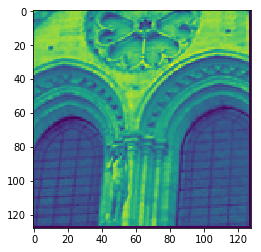

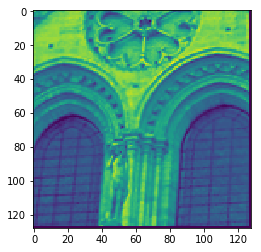

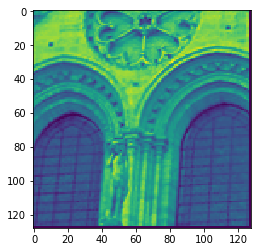

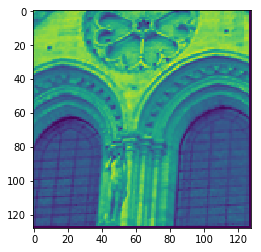

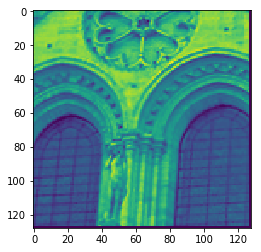

...

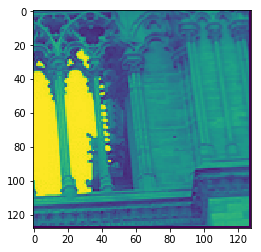

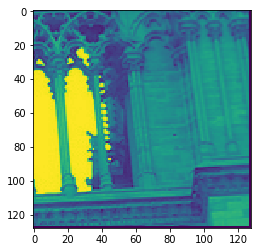

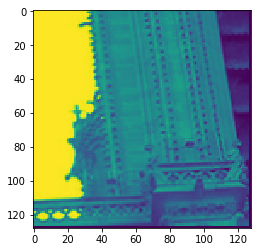

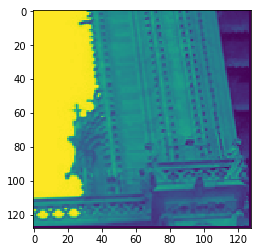

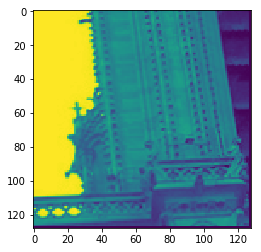

Done!


In [18]:
img = cv2.imread('../images/NotreDame1.jpg')
gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
patches = getPatches(keypoint1, gray,size=128, num=len(keypoint1))
i = 0
for patch in patches:
    im = patch[0].numpy()
    plt.imshow(im)
    plt.show()
print("Done!")

### Save the patches with PyTorch
For each image, you can output the patches within one tensor. In above examples, tensor ***patches*** is the one that you should store in a list. And then save the list as a "patches.pt" file:

In [64]:
all_patches = []
all_patches.append(patches)
output_dir = "patches.pt"
torch.save(all_patches, output_dir)
print("Done!")

### Test with your saved patches

In [7]:
test_patches = torch.load(output_dir)
print(type(test_patches))
print(test_patches[0].shape)
print("Done!")

<class 'list'>
torch.Size([10, 1, 64, 64])
